# **EDA**

In [1]:
!pip install ydata-profiling pandas

  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 390.9/390.9 kB 9.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.5/296.5 kB 18.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 687.8/687.8 kB 24.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 104.8/104.8 kB 5.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.5/4.5 MB 44.1 MB/s eta 0:00:00
  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27081 sha256=68b5a79923350ebed2239c2cc8f0b22801e447d0dec10743cdad7848ebe581b4
  Stored in directory: /root/.cache/pip/wheels/8d/55/1a/19cd535375ed1ede0c996405ebffe34b196d78e2d9545723a2
Successfully built htmlmin


In [3]:
import pandas as pd
from ydata_profiling import ProfileReport
from google.colab import files

print("Please upload a CSV file:")
uploaded = files.upload()

file_name = next(iter(uploaded))
df = pd.read_csv(file_name)

profile = ProfileReport(df, explorative=True)

profile.to_notebook_iframe()

report_filename = "data_profiling_report.html"
profile.to_file(report_filename)

print(f"Report saved as {report_filename}")
files.download(report_filename)

Please upload a CSV file:


Saving Sales_Data.csv to Sales_Data.csv


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

Report saved as data_profiling_report.html


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [12]:
import pandas as pd
from ydata_profiling import ProfileReport
from google.colab import files

print("Please upload a CSV file:")
uploaded = files.upload()

file_name = next(iter(uploaded))
df = pd.read_csv(file_name)

profile = ProfileReport(df, explorative=True)

profile.to_notebook_iframe()

report_filename = "data_profiling_report.html"
profile.to_file(report_filename)

print(f"Report saved as {report_filename}")
files.download(report_filename)

Please upload a CSV file:


Saving Cleaned_Daily_Rate.csv to Cleaned_Daily_Rate (1).csv


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

Report saved as data_profiling_report.html


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [24]:
import pandas as pd
from ydata_profiling import ProfileReport
from google.colab import files

print("Please upload a CSV file:")
uploaded = files.upload()

file_name = next(iter(uploaded))
df = pd.read_csv(file_name)

profile = ProfileReport(df, explorative=True)

profile.to_notebook_iframe()

report_filename = "data_profiling_report.html"
profile.to_file(report_filename)

print(f"Report saved as {report_filename}")
files.download(report_filename)

Please upload a CSV file:


Saving goldbee (1).csv to goldbee (1).csv


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

Report saved as data_profiling_report.html


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

# **Sales trend analysis: Upward/Downward trends**

In [8]:
import pandas as pd
import numpy as np
from scipy import stats

In [13]:
goldbee = pd.read_excel("/content/GoldBees Data.xlsx")
goldbee["Buy Date"] = pd.to_datetime(goldbee["Buy Date"], format="%d-%m-%Y").dt.strftime("%d-%m-%Y")
goldbee.to_csv("goldbee.csv", index=False)

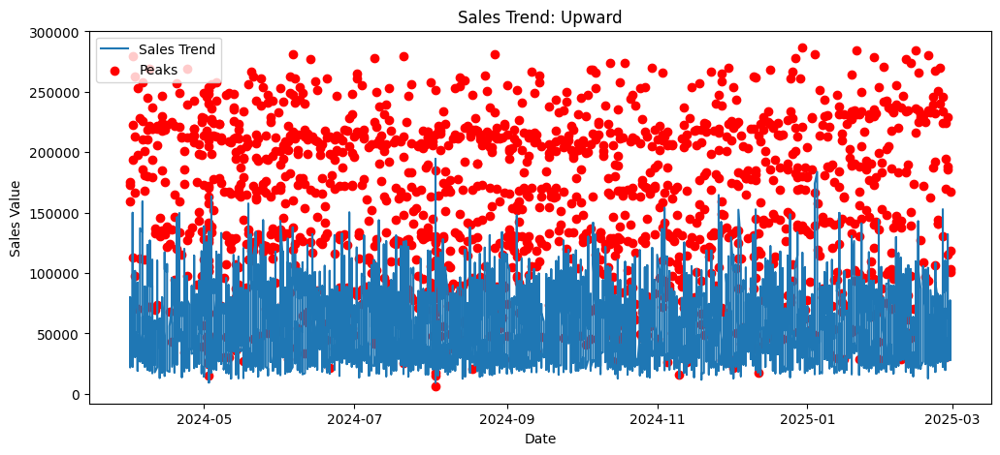

Sales Trend: Upward
Daily Rate Trend: Upward
Gold Price Trend: Downward


In [23]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression
from scipy.signal import find_peaks

# Load datasets
sales_data = pd.read_csv("/content/Sales_Data.csv")
daily_rate_data = pd.read_csv("/content/Cleaned_Daily_Rate.csv")
gold_data = pd.read_csv("/content/goldbee.csv")

# Convert date columns to datetime
sales_data['Bill_date'] = pd.to_datetime(sales_data['Bill_date'], dayfirst=True)
daily_rate_data['Date'] = pd.to_datetime(daily_rate_data['Date'])
gold_data['Buy Date'] = pd.to_datetime(gold_data['Buy Date'], dayfirst=True)

# Sorting by date
sales_data = sales_data.sort_values('Bill_date')
daily_rate_data = daily_rate_data.sort_values('Date')
gold_data = gold_data.sort_values('Buy Date')

# Moving Average for trend detection
def moving_average_trend(data, column, window=7):
    data[f"{column}_MA"] = data[column].rolling(window=window).mean()
    return data

sales_data = moving_average_trend(sales_data, 'Sales_Value', window=7)
daily_rate_data = moving_average_trend(daily_rate_data, 'Gold_RTGS_24K', window=7)
gold_data = moving_average_trend(gold_data, 'Latest Price', window=7)

# Linear Regression Trend Detection
def detect_trend(data, column):
    data = data.dropna()
    X = np.arange(len(data)).reshape(-1, 1)
    y = data[column].values.reshape(-1, 1)
    model = LinearRegression()
    model.fit(X, y)
    trend = "Upward" if model.coef_[0][0] > 0 else "Downward"
    return trend

sales_trend = detect_trend(sales_data, 'Sales_Value_MA')
daily_rate_trend = detect_trend(daily_rate_data, 'Gold_RTGS_24K_MA')
gold_trend = detect_trend(gold_data, 'Latest Price_MA')

# Identify Local Maxima
def identify_peaks(data, column):
    peaks, _ = find_peaks(data[column], distance=10)
    return data.iloc[peaks]

sales_peaks = identify_peaks(sales_data, 'Sales_Value')
daily_rate_peaks = identify_peaks(daily_rate_data, 'Gold_RTGS_24K')
gold_peaks = identify_peaks(gold_data, 'Latest Price')

plt.figure(figsize=(12, 5))
plt.plot(sales_data['Bill_date'], sales_data['Sales_Value_MA'], label='Sales Trend')
plt.scatter(sales_peaks['Bill_date'], sales_peaks['Sales_Value'], color='red', label='Peaks')
plt.legend()
plt.title(f"Sales Trend: {sales_trend}")
plt.xlabel("Date")
plt.ylabel("Sales Value")
plt.show()

print(f"Sales Trend: {sales_trend}")
print(f"Daily Rate Trend: {daily_rate_trend}")
print(f"Gold Price Trend: {gold_trend}")

# Purchasing behavior insights

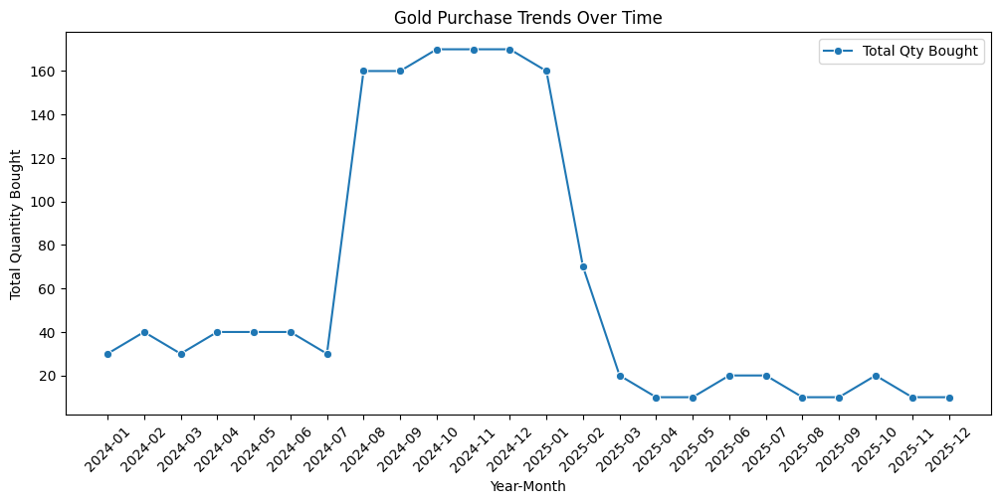

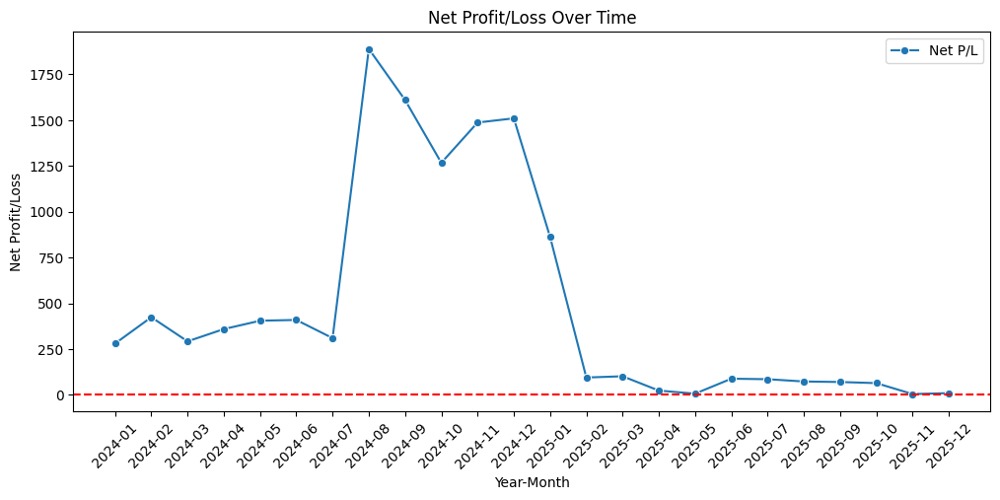

Total Spent: ₹93,170.26
Total Net Profit/Loss: ₹11,727.95
Average Buy Price: ₹64.26


In [33]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load dataset
gold_data = pd.read_csv("/content/goldbee.csv")

# Convert 'Buy Date' to datetime
gold_data['Buy Date'] = pd.to_datetime(gold_data['Buy Date'], dayfirst=True)

# Create 'Year-Month' column
gold_data['Year-Month'] = gold_data['Buy Date'].dt.to_period('M').astype(str)

# Aggregate purchases per month
monthly_purchases = gold_data.groupby('Year-Month').agg({
    'Qty': 'sum',
    'Buy Amount': 'sum',
    'Net Buy Amount': 'sum',
    'Net P/L': 'sum'
}).reset_index()

# Plot purchase trends
plt.figure(figsize=(12, 5))
sns.lineplot(data=monthly_purchases, x='Year-Month', y='Qty', marker='o', label="Total Qty Bought")
plt.xticks(rotation=45)
plt.title("Gold Purchase Trends Over Time")
plt.xlabel("Year-Month")
plt.ylabel("Total Quantity Bought")
plt.legend()
plt.show()


# Financial impact
plt.figure(figsize=(12, 5))
sns.lineplot(data=monthly_purchases, x='Year-Month', y='Net P/L', marker='o', label="Net P/L")
plt.xticks(rotation=45)
plt.axhline(0, color='red', linestyle='--')  # Highlight break-even point
plt.title("Net Profit/Loss Over Time")
plt.xlabel("Year-Month")
plt.ylabel("Net Profit/Loss")
plt.legend()
plt.show()

# Print insights
total_profit = gold_data['Net P/L'].sum()
total_spent = gold_data['Buy Amount'].sum()
avg_buy_price = gold_data['Buy Amount'].sum() / gold_data['Qty'].sum()

print(f"Total Spent: ₹{total_spent:,.2f}")
print(f"Total Net Profit/Loss: ₹{total_profit:,.2f}")
print(f"Average Buy Price: ₹{avg_buy_price:,.2f}")


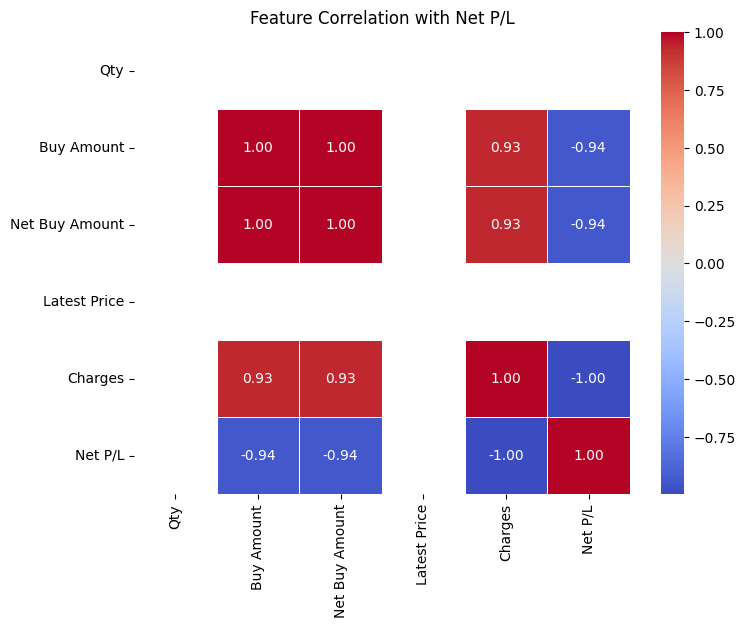

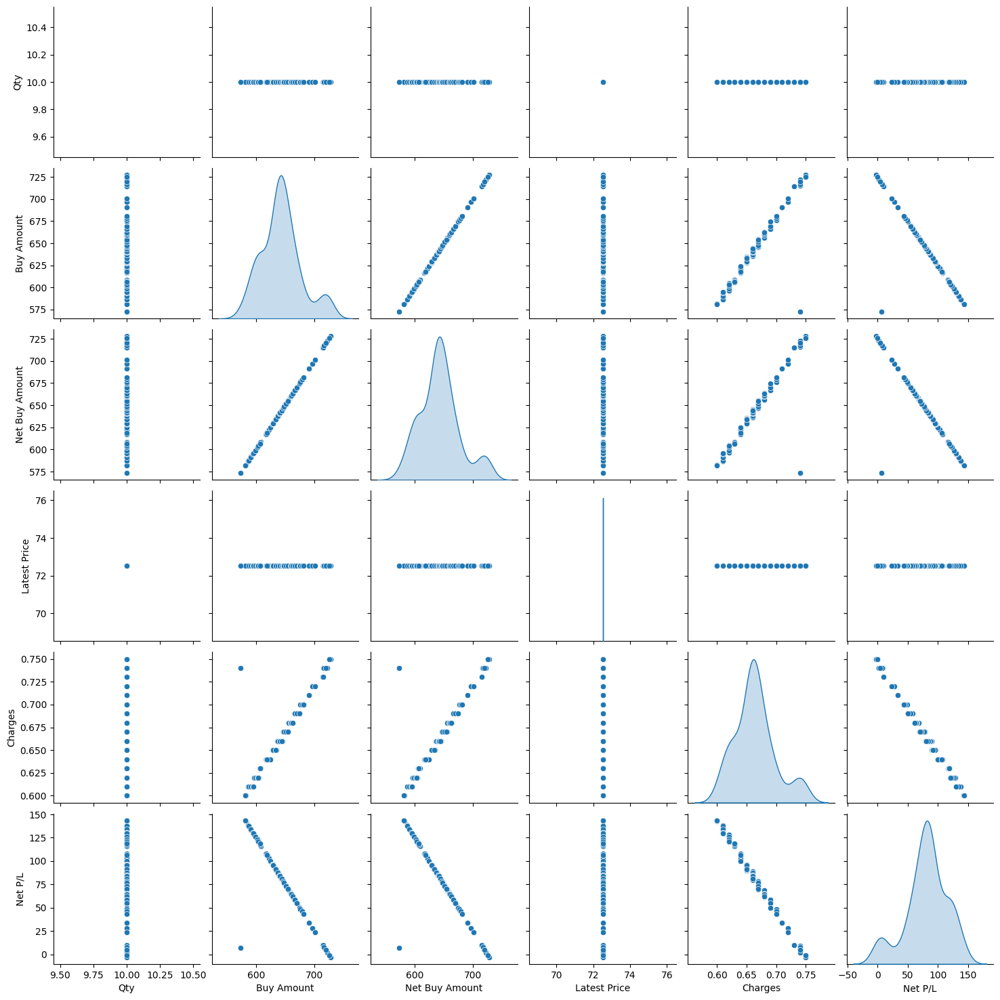

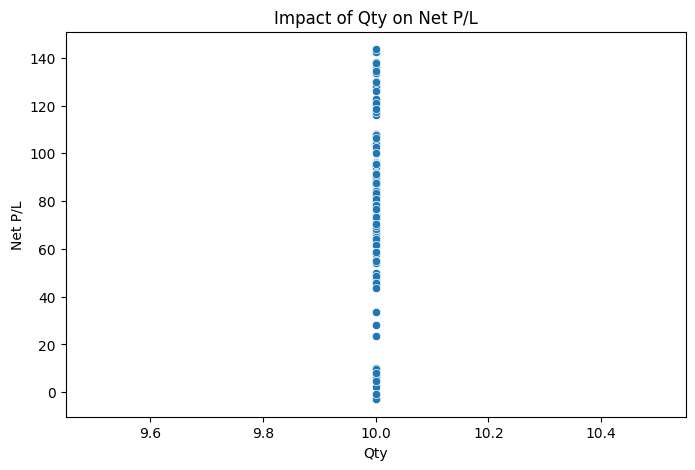

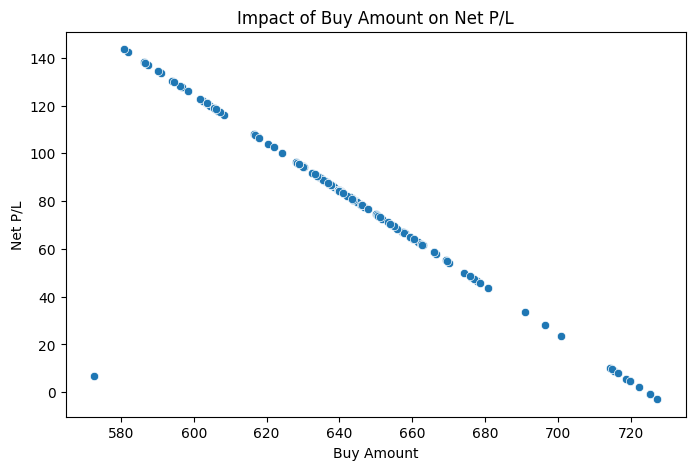

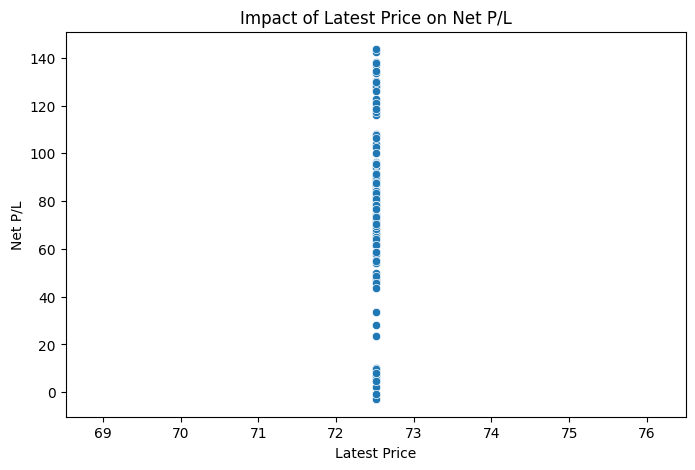

In [35]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Load dataset
gold_data = pd.read_csv("/content/goldbee.csv")

# Convert 'Buy Date' to datetime
gold_data['Buy Date'] = pd.to_datetime(gold_data['Buy Date'], dayfirst=True)

# Selecting numerical features for analysis
features = ['Qty', 'Buy Amount', 'Net Buy Amount', 'Latest Price', 'Charges', 'Net P/L']

# Drop NaN values
gold_data = gold_data.dropna(subset=features)

# Compute correlation matrix
corr_matrix = gold_data[features].corr()

# Heatmap to visualize correlation with 'Net P/L'
plt.figure(figsize=(8, 6))
sns.heatmap(corr_matrix, annot=True, cmap="coolwarm", fmt=".2f", linewidths=0.5)
plt.title("Feature Correlation with Net P/L")
plt.show()

# Pairplot to see feature relationships
sns.pairplot(gold_data[features], diag_kind="kde")
plt.show()

# Analyzing impact of individual features
for feature in ['Qty', 'Buy Amount', 'Latest Price']:
    plt.figure(figsize=(8, 5))
    sns.scatterplot(data=gold_data, x=feature, y='Net P/L')
    plt.title(f"Impact of {feature} on Net P/L")
    plt.xlabel(feature)
    plt.ylabel("Net P/L")
    plt.show()


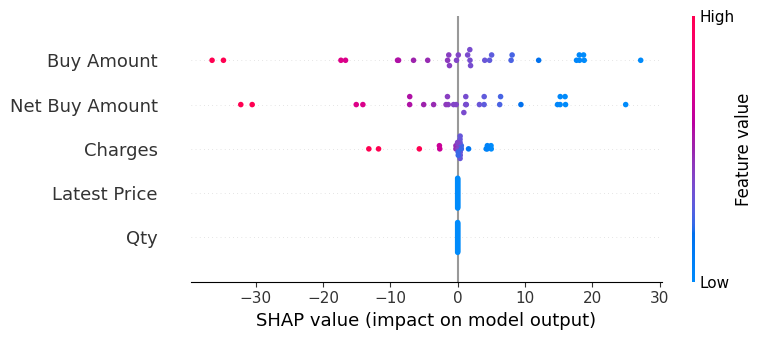

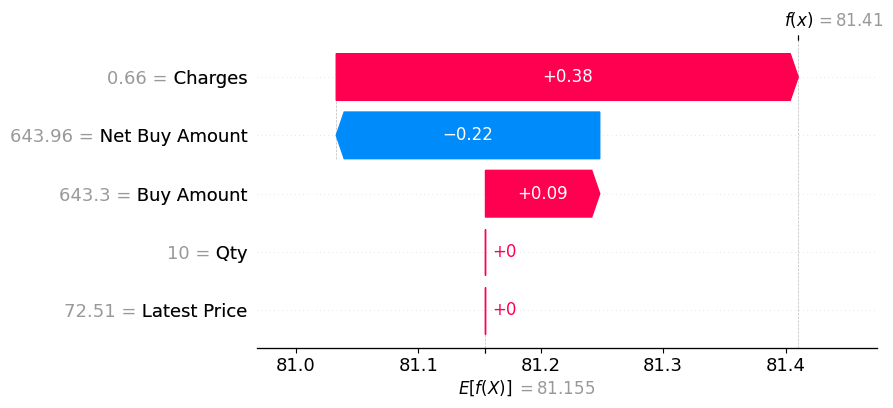

In [36]:
import pandas as pd
import numpy as np
import shap
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor

# Load dataset
gold_data = pd.read_csv("/content/goldbee.csv")

# Convert 'Buy Date' to datetime
gold_data['Buy Date'] = pd.to_datetime(gold_data['Buy Date'], dayfirst=True)

# Selecting numerical features for analysis
features = ['Qty', 'Buy Amount', 'Net Buy Amount', 'Latest Price', 'Charges']
target = 'Net P/L'

# Drop NaN values
gold_data = gold_data.dropna(subset=features + [target])

# Split data for training (80%) and testing (20%)
X_train, X_test, y_train, y_test = train_test_split(gold_data[features], gold_data[target], test_size=0.2, random_state=42)

# Train a simple model
model = RandomForestRegressor(n_estimators=100, random_state=42)
model.fit(X_train, y_train)

# Explain model using SHAP
explainer = shap.Explainer(model, X_train)
shap_values = explainer(X_test)

# Summary plot - Shows feature impact on Net P/L
shap.summary_plot(shap_values, X_test)

# Waterfall plot for a single prediction
sample_idx = 0  # Change index to see explanations for different points
shap.waterfall_plot(shap_values[sample_idx])

Charges (+0.38 impact on profit) → Higher charges increased profit.

Net Buy Amount (-0.22 impact on profit) → Higher net buy amount decreased profit.

Buy Amount (+0.09 impact on profit) → Slightly increased profit.

Qty and Latest Price had no impact on this specific prediction.

# **HYPOTHESIS TESTING**

In [59]:
import pandas as pd
import numpy as np
from scipy.stats import pearsonr, ttest_ind, f_oneway, chi2_contingency

# Load Data
df = pd.read_csv("Sales_Data.csv")

df['Bill_date'] = pd.to_datetime(df['Bill_date'], dayfirst=True)
df['Month'] = df['Bill_date'].dt.month

print("Hypothesis : Buy Amount vs. Net P/L ")
print("Null Hypothesis (H0): There is no significant relationship between Buy Amount and Net P/L.")
print("Alternative Hypothesis (H1): Higher Buy Amount is associated with higher Net P/L.\n")
buy_amount = df['Sales_Value']
net_profit = df['Profit Margin %']

corr, p_value_corr = pearsonr(buy_amount, net_profit)
t_stat, p_value_ttest = ttest_ind(buy_amount, net_profit, equal_var=False)

print(f"Pearson Correlation: {corr}, p-value: {p_value_corr}")
if p_value_corr < 0.05:
    print("Reject the null hypothesis: There is a significant relationship between Buy Amount and Net P/L.")
else:
    print("Fail to reject the null hypothesis: No significant relationship found.")

Hypothesis : Buy Amount vs. Net P/L 
Null Hypothesis (H0): There is no significant relationship between Buy Amount and Net P/L.
Alternative Hypothesis (H1): Higher Buy Amount is associated with higher Net P/L.

Pearson Correlation: 0.0338839459692825, p-value: 5.884236847774343e-07
Reject the null hypothesis: There is a significant relationship between Buy Amount and Net P/L.


In [60]:
print("Hypothesis : Monthly Buying Trends (Chi-Square Test)")
print("Null Hypothesis (H0): Buy Amount distribution does not vary significantly across months.")
print("Alternative Hypothesis (H1): Buy Amount distribution varies significantly across months.\n")
month_counts = df['Month'].value_counts().sort_index()
expected = np.ones_like(month_counts) * month_counts.mean()
chi2_stat, p_value_chi2 = chi2_contingency([month_counts, expected])[:2]

print(f"Chi-Square Test: Chi2-statistic = {chi2_stat}, p-value = {p_value_chi2}")
if p_value_chi2 < 0.05:
    print("Reject the null hypothesis: Buy Amount distribution varies significantly across months.")
else:
    print("Fail to reject the null hypothesis: No significant variation found.")

Hypothesis : Monthly Buying Trends (Chi-Square Test)
Null Hypothesis (H0): Buy Amount distribution does not vary significantly across months.
Alternative Hypothesis (H1): Buy Amount distribution varies significantly across months.

Chi-Square Test: Chi2-statistic = 312.9768105303783, p-value = 2.797938435468681e-61
Reject the null hypothesis: Buy Amount distribution varies significantly across months.


In [61]:
print("Hypothesis: Net P/L difference between odd and even transaction IDs")
print("Null Hypothesis (H0): The average Net P/L is the same for transactions with odd and even IDs.")
print("Alternative Hypothesis (H1): The average Net P/L is significantly different for transactions with odd and even IDs.\n")
df['Transaction_ID'] = df.index + 1  # Assuming index is unique
odd_net_pl = df[df['Transaction_ID'] % 2 == 1]['Profit Margin %']
even_net_pl = df[df['Transaction_ID'] % 2 == 0]['Profit Margin %']

t_stat_odd_even, p_value_odd_even = ttest_ind(odd_net_pl, even_net_pl, equal_var=False)
print(f"T-Test: t-statistic = {t_stat_odd_even}, p-value = {p_value_odd_even}")
if p_value_odd_even < 0.05:
    print("Reject the null hypothesis: There is a significant difference in Net P/L between odd and even transactions.")
else:
    print("Fail to reject the null hypothesis: No significant difference found between odd and even transactions.")


Hypothesis: Net P/L difference between odd and even transaction IDs
Null Hypothesis (H0): The average Net P/L is the same for transactions with odd and even IDs.
Alternative Hypothesis (H1): The average Net P/L is significantly different for transactions with odd and even IDs.

T-Test: t-statistic = -0.5984783890986671, p-value = 0.5495270377157297
Fail to reject the null hypothesis: No significant difference found between odd and even transactions.


# **MARKET BASKET ANALYSIS**

In [73]:
pip install mlxtend

In [75]:
from mlxtend.frequent_patterns import apriori, association_rules

# Use 'Category' and 'Product' to create transaction baskets
basket = df.pivot_table(index="Bill No", columns="Product", values="Pcs", aggfunc="sum", fill_value=0)

# Convert counts into 0/1 format for the Apriori algorithm
basket = basket.map(lambda x: 1 if x > 0 else 0)

# Apply Apriori algorithm to find frequent itemsets
frequent_itemsets = apriori(basket, min_support=0.01, use_colnames=True)

# Generate association rules
rules = association_rules(frequent_itemsets, metric="lift", min_threshold=1.0)

# Sort by confidence to show strongest rules first
rules_sorted = rules.sort_values(by="confidence", ascending=False)

# Display top rules
rules_sorted.head(10)

/usr/local/lib/python3.11/dist-packages/mlxtend/frequent_patterns/fpcommon.py:161: DeprecationWarning: DataFrames with non-bool types result in worse computationalperformance and their support might be discontinued in the future.Please use a DataFrame with bool type
  warnings.warn(


,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,representativity,leverage,conviction,zhangs_metric,jaccard,certainty,kulczynski
20,"(GO_PENDANT, LD BANGLES)",(G CHAIN),0.028959,0.393140,0.015602,0.538745,1.370367,1.0,0.004217,1.315673,0.278329,0.038381,0.239933,0.289215
28,"(G RING, GO_PENDANT, GO_EARRINGS)",(G CHAIN),0.026501,0.393140,0.012823,0.483871,1.230787,1.0,0.002405,1.175792,0.192616,0.031521,0.149510,0.258244
16,"(GO_PENDANT, GO_EARRINGS)",(G CHAIN),0.086878,0.393140,0.041676,0.479705,1.220190,1.0,0.007521,1.166377,0.197624,0.095076,0.142644,0.292856
12,"(GO_BRACELET, GO_PENDANT)",(G CHAIN),0.020945,0.393140,0.010045,0.479592,1.219902,1.0,0.001811,1.166124,0.184118,0.024861,0.142458,0.252571
0,(GO_PENDANT),(G CHAIN),0.212225,0.393140,0.099915,0.470796,1.197528,1.0,0.016481,1.146741,0.209383,0.197674,0.127964,0.362470
8,"(G RING, GO_PENDANT)",(G CHAIN),0.066147,0.393140,0.031096,0.470113,1.195792,1.0,0.005092,1.145264,0.175332,0.072623,0.126839,0.274605
2,"(GO_BRACELET, G RING)",(G CHAIN),0.035371,0.393140,0.014212,0.401813,1.022061,1.0,0.000307,1.014499,0.022376,0.034305,0.014292,0.218982
24,"(GO_BRACELET, GO_EARRINGS)",(G RING),0.042637,0.344518,0.015922,0.373434,1.083930,1.0,0.001233,1.046149,0.080880,0.042890,0.044113,0.209825
3,"(GO_BRACELET, G CHAIN)",(G RING),0.039859,0.344518,0.014212,0.356568,1.034977,1.0,0.000480,1.018728,0.035198,0.038395,0.018384,0.198911
29,"(G CHAIN, G RING, GO_EARRINGS)",(GO_PENDANT),0.045950,0.212225,0.012823,0.279070,1.314972,1.0,0.003072,1.092720,0.251064,0.052265,0.084853,0.169746


# **SEASONAL PROMOTIONS**

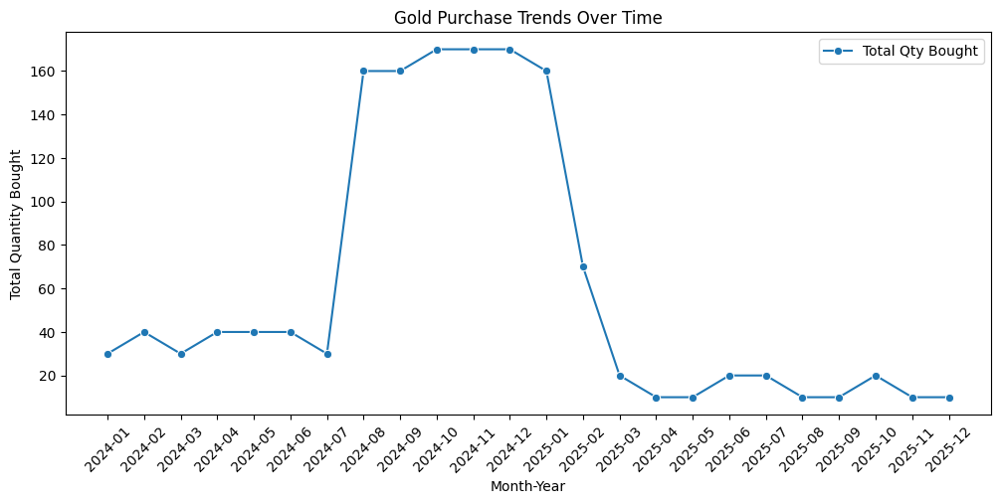

Top months for promotional campaigns based on purchases:
    Year-Month  Qty  Buy Amount
11    2024-12  170     10805.8
9     2024-10  170     11048.4
10    2024-11  170     10828.7


In [78]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load dataset
gold_data = pd.read_csv("/content/goldbee.csv")

# Convert 'Buy Date' to datetime
gold_data['Buy Date'] = pd.to_datetime(gold_data['Buy Date'], dayfirst=True)

# Extract Month and Year
gold_data['Year-Month'] = gold_data['Buy Date'].dt.to_period('M')

# Aggregate purchases per month
monthly_purchases = gold_data.groupby('Year-Month').agg({
    'Qty': 'sum',  # Total gold bought
    'Buy Amount': 'sum'  # Total money spent
}).reset_index()

# Convert 'Year-Month' back to string for plotting
monthly_purchases['Year-Month'] = monthly_purchases['Year-Month'].astype(str)

# Plot purchase trends
plt.figure(figsize=(12, 5))
sns.lineplot(data=monthly_purchases, x='Year-Month', y='Qty', marker='o', label="Total Qty Bought")
plt.xticks(rotation=45)
plt.title("Gold Purchase Trends Over Time")
plt.xlabel("Month-Year")
plt.ylabel("Total Quantity Bought")
plt.legend()
plt.show()

# Identify peak months for promotional strategies
top_months = monthly_purchases.sort_values(by='Qty', ascending=False).head(3)
print("Top months for promotional campaigns based on purchases:\n", top_months)